In [ ]:
!apt-get update -qq
!apt-get install fonts-nanum* -qq

Selecting previously unselected package fonts-nanum.
(Reading database ... 120511 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Selecting previously unselected package fonts-nanum-coding.
Preparing to unpack .../fonts-nanum-coding_2.5-3_all.deb ...
Unpacking fonts-nanum-coding (2.5-3) ...
Selecting previously unselected package fonts-nanum-eco.
Preparing to unpack .../fonts-nanum-eco_1.000-7_all.deb ...
Unpacking fonts-nanum-eco (1.000-7) ...
Selecting previously unselected package fonts-nanum-extra.
Preparing to unpack .../fonts-nanum-extra_20200506-1_all.deb ...
Unpacking fonts-nanum-extra (20200506-1) ...
Setting up fonts-nanum-extra (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Setting up fonts-nanum-coding (2.5-3) ...
Setting up fonts-nanum-eco (1.000-7) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...


In [ ]:
import pickle
data_all_sec = pickle.load(open('/content/drive/MyDrive/separated_datasets_sectors.pkl','rb'))
sec_list = list(data_all_sec.keys())
sec_list

['IT부품',
 '건설',
 '건설업',
 '광업',
 '금속',
 '금융',
 '기계',
 '기계·장비',
 '기타금융',
 '기타서비스',
 '기타제조',
 '기타제조업',
 '농업, 임업 및 어업',
 '디지털컨텐츠',
 '반도체',
 '방송서비스',
 '보험',
 '비금속',
 '비금속광물',
 '서비스업',
 '섬유·의류',
 '섬유의복',
 '소프트웨어',
 '숙박·음식',
 '오락·문화',
 '운송',
 '운송장비·부품',
 '운수장비',
 '운수창고업',
 '유통',
 '유통업',
 '은행',
 '음식료·담배',
 '음식료품',
 '의료·정밀기기',
 '의료정밀',
 '의약품',
 '인터넷',
 '일반전기전자',
 '전기·가스·수도',
 '전기가스업',
 '전기전자',
 '정보기기',
 '제약',
 '종이·목재',
 '종이목재',
 '증권',
 '철강금속',
 '출판·매체복제',
 '컴퓨터서비스',
 '통신서비스',
 '통신업',
 '통신장비',
 '화학']

In [ ]:
with open('df_name.pkl', 'rb') as f:
    df_name = pickle.load(f)

In [ ]:
for sec in sec_list:
    df_ex = data_all_sec[sec]
    df_ex_c = df_ex[['날짜','종가','종목코드','시가총액','업종명']]
    df_ex_c['종목명'] = df_ex_c['종목코드'].map(df_name.set_index('종목코드')['종목명'])

,날짜,종가,종목코드,시가총액,업종명,종목명
55328,2021-06-01,20550,060720,486498706650,IT부품,KH바텍
55329,2021-06-02,20800,060720,492417182400,IT부품,KH바텍
55330,2021-06-03,21650,060720,512539999950,IT부품,KH바텍
55331,2021-06-04,21750,060720,514907390250,IT부품,KH바텍
55332,2021-06-07,21250,060720,503070438750,IT부품,KH바텍
...,...,...,...,...,...,...
961813,2023-05-23,5650,092300,105501410400,IT부품,현우산업
961814,2023-05-24,5540,092300,103447400640,IT부품,현우산업
961815,2023-05-25,5630,092300,105127954080,IT부품,현우산업
961816,2023-05-26,5890,092300,109982886240,IT부품,현우산업


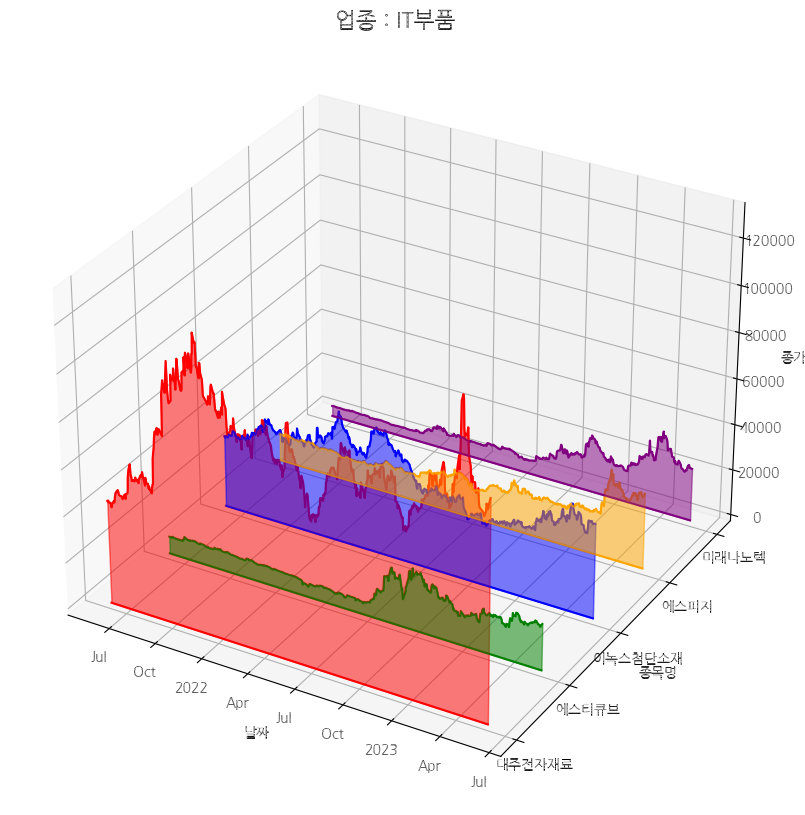

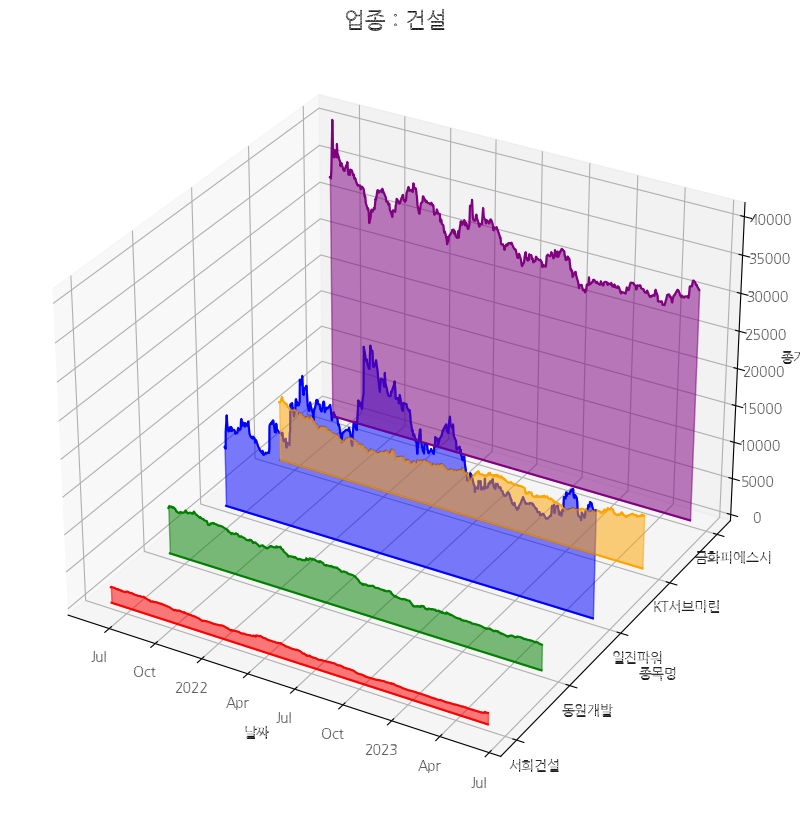

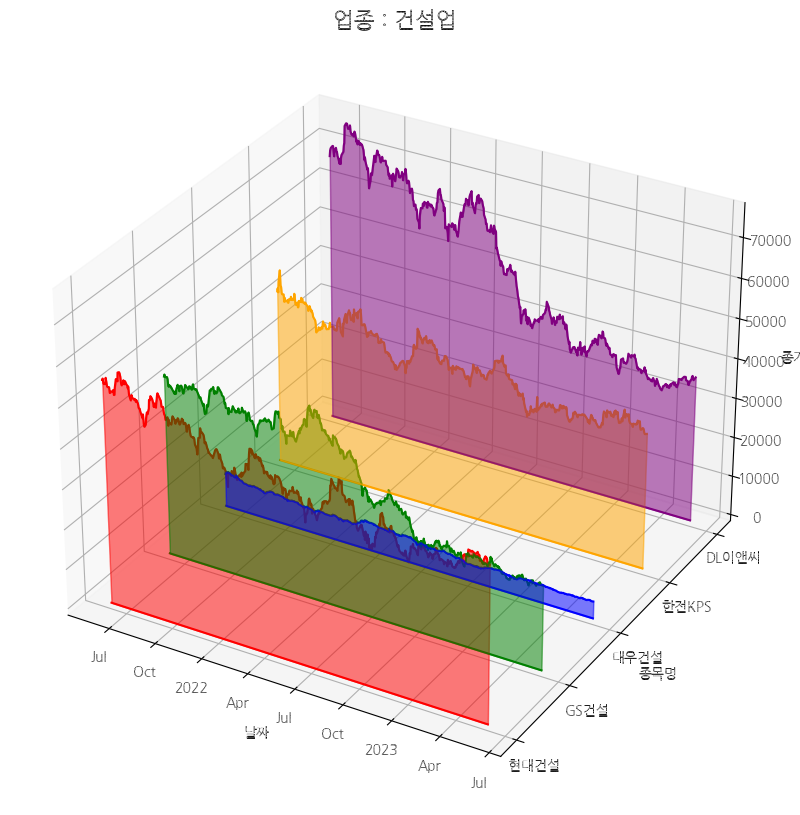

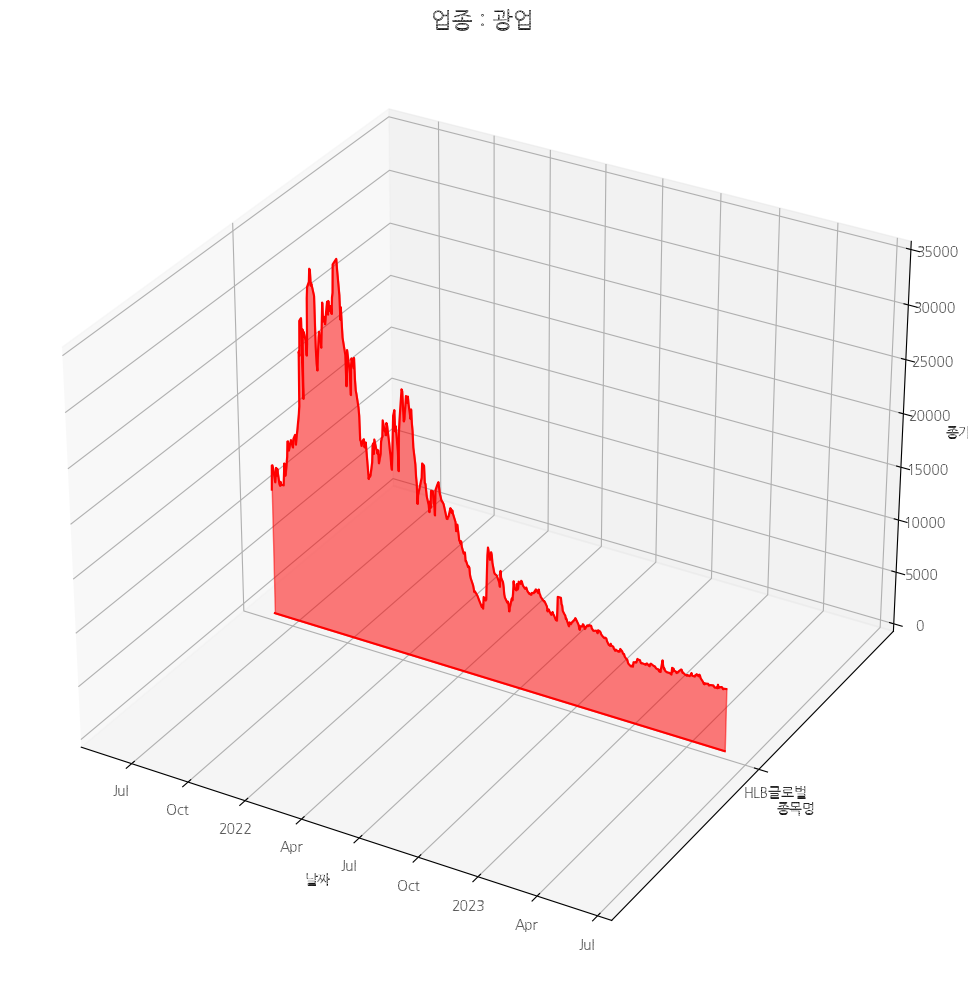

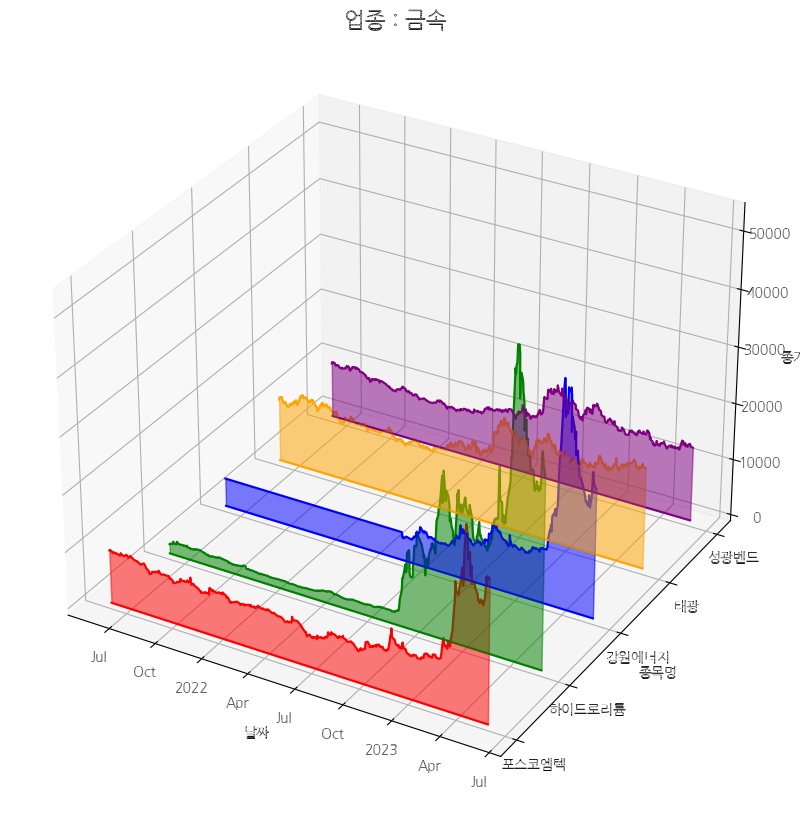

...

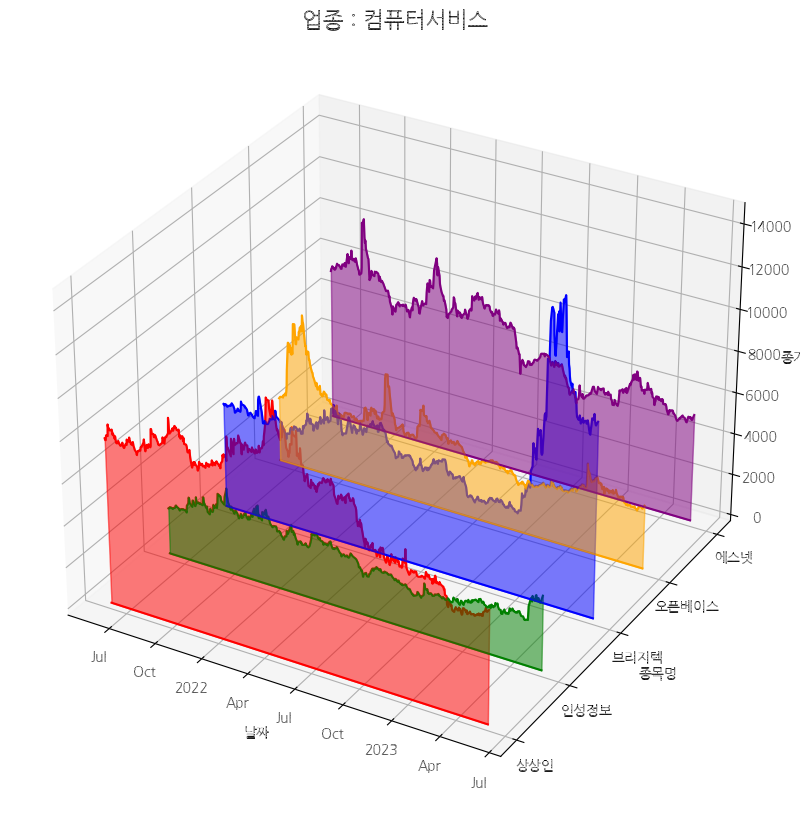

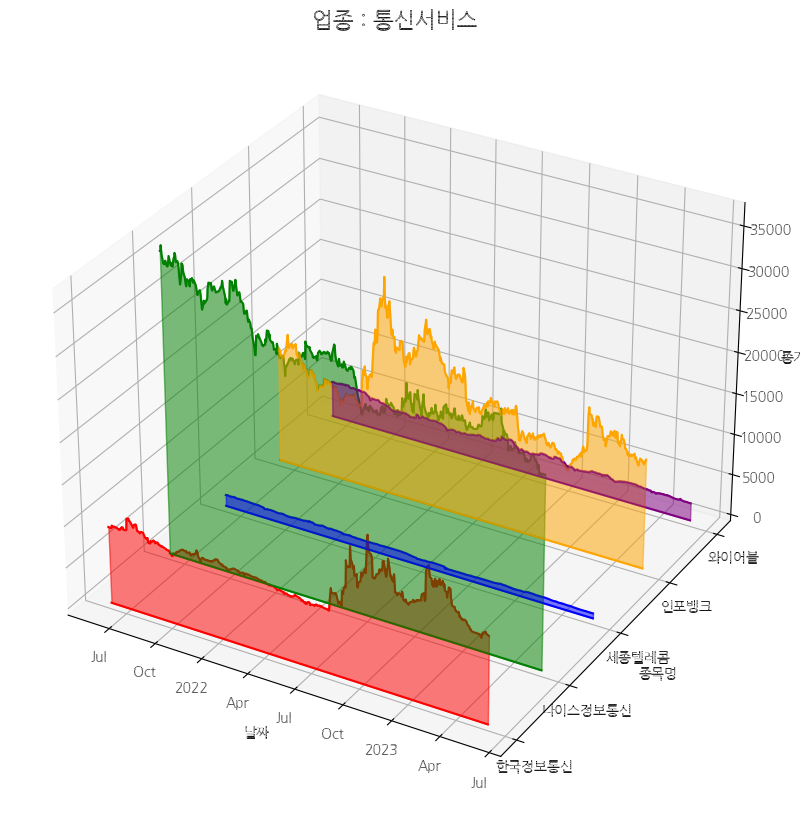

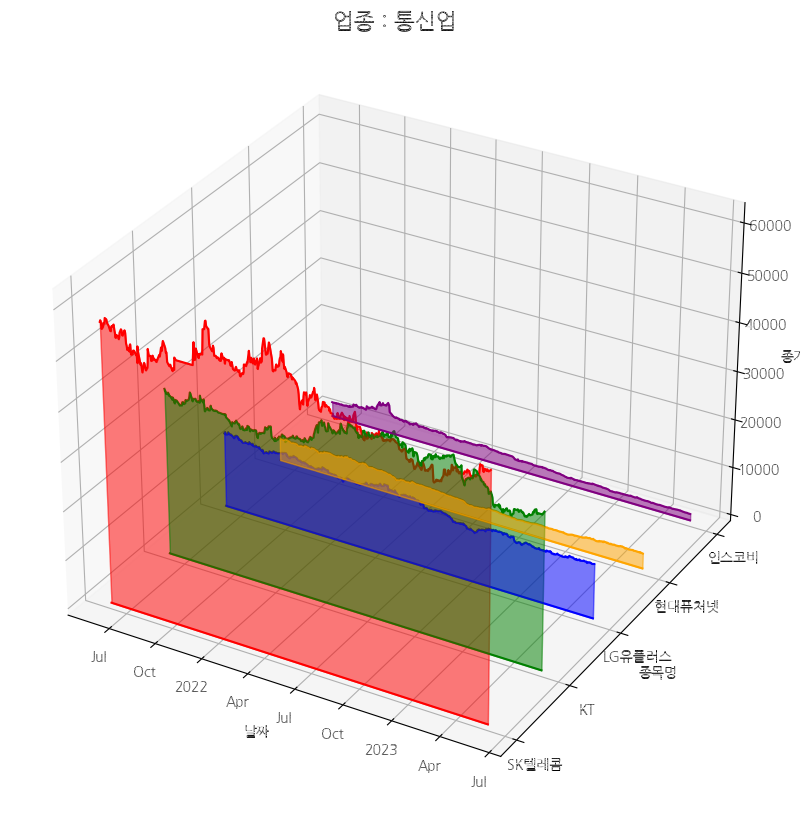

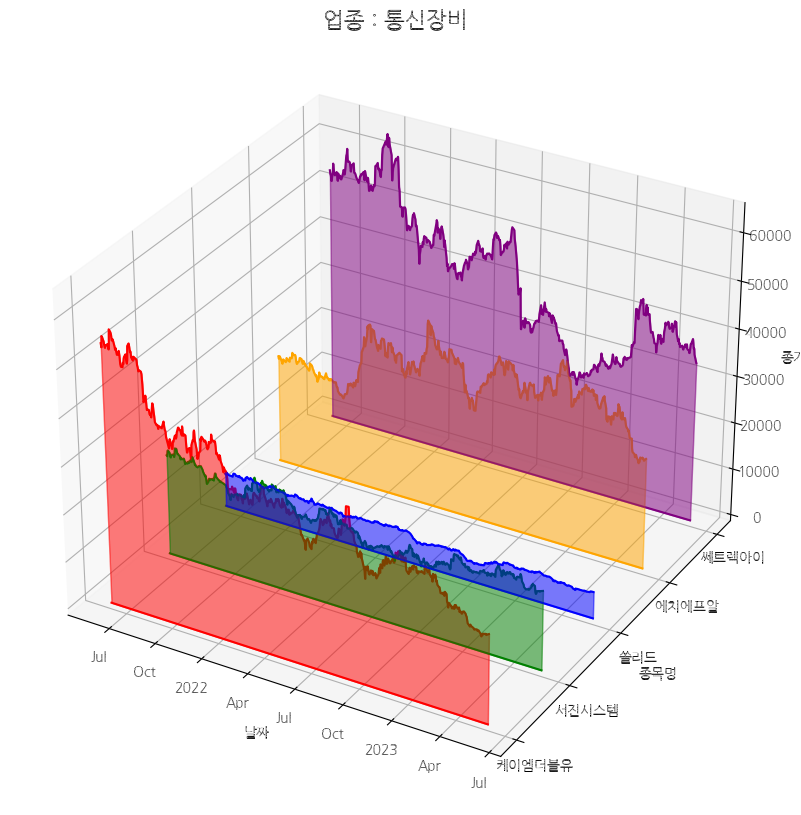

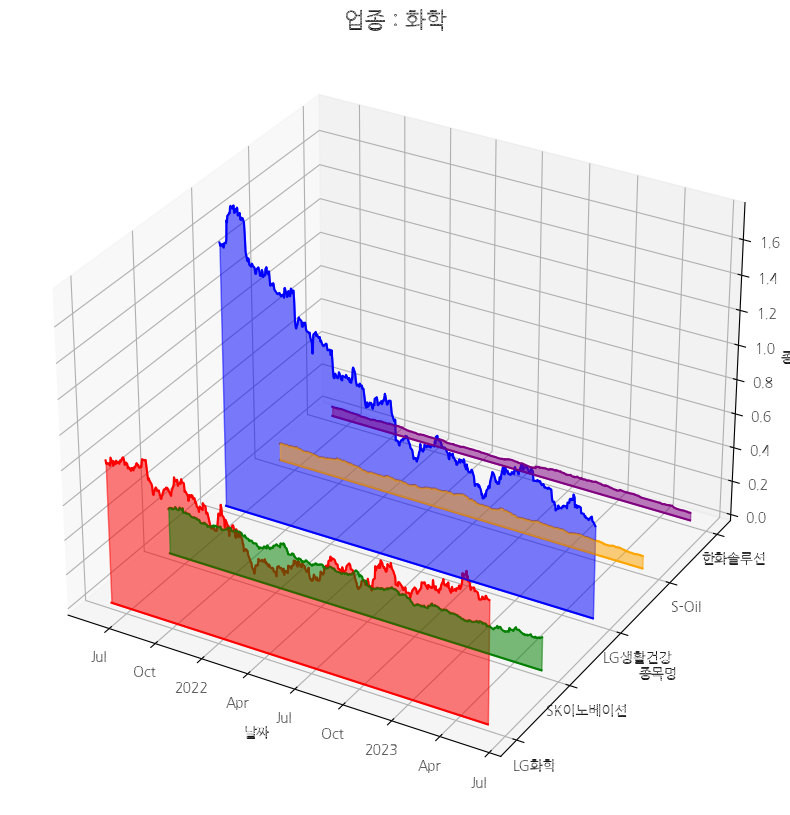

In [ ]:
# 예시 코드 gpt

import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import matplotlib.dates as mdates
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import os

# 경고 메시지 처리
import warnings

# unicode minus를 사용하지 않기 위한 설정 (minus 깨짐현상 방지)
plt.rcParams['axes.unicode_minus'] = False
path = '/usr/share/fonts/truetype/nanum/NanumGothicEco.ttf'  # 설치된 나눔글꼴중 원하는 녀석의 전체 경로를 가져오자
font_name = fm.FontProperties(fname=path, size=10).get_name()
plt.rc('font', family=font_name)

fe = fm.FontEntry(
    fname=r'/usr/share/fonts/truetype/nanum/NanumGothicEco.ttf',name='NanumGothicEco')
fm.fontManager.ttflist.insert(0, fe)

plt.rcParams.update({'font.size': 10, 'font.family': 'NanumGothicEco'})
# 경고메시지 출력 생략
warnings.filterwarnings('ignore')

for sec in sec_list:
    df_ex = data_all_sec[sec]
    df_ex_c = df_ex[['날짜','종가','종목코드','시가총액','업종명']]
    df_ex_c['종목명'] = df_ex_c['종목코드'].map(df_name.set_index('종목코드')['종목명'])
    # Load data
    df = df_ex_c.copy()
    # Parse dates
    df['날짜'] = pd.to_datetime(df['날짜'])

    # Identify top 10 stocks based on the latest closing price
    top_10_stocks = df.groupby('종목코드')['시가총액'].last().nlargest(5).index

    # Filter dataframe to include only top 10 stocks
    df_top_10 = df[df['종목코드'].isin(top_10_stocks)]

    # Convert datetime to numerical format for plotting
    df_top_10['날짜'] = mdates.date2num(df_top_10['날짜'])

    # Create figure
    fig = plt.figure(figsize=(16, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Generate colors
    colors = ['red', 'green', 'blue', 'orange', 'purple']

    for i, stock_code in enumerate(top_10_stocks):
        df_temp = df_top_10[df_top_10['종목코드'] == stock_code]
        ax.plot(df_temp['날짜'].values, np.repeat(i, df_temp.shape[0]), df_temp['종가'].values, color=colors[i], label=str(stock_code))
        ax.plot(df_temp['날짜'].values, np.repeat(i, df_temp.shape[0]), np.zeros_like(df_temp['종가'].values), color=colors[i])  # Draw line at z=0
        ax.add_collection3d(plt.fill_between(df_temp['날짜'].values, df_temp['종가'].values, color=colors[i], alpha=0.3), zs=i, zdir='y')  # Fill between line and z=0

    # Set labels
    ax.set_xlabel('날짜')
    ax.set_ylabel('종목명')
    ax.set_zlabel('종가')

    # Format x axis to display dates
    locator = mdates.AutoDateLocator()
    formatter = mdates.ConciseDateFormatter(locator)
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)

    # Set yticks and yticklabels
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    name_chg = []
    for sto_num in list(top_10_stocks):
        name_chg.append(df_name[df_name['종목코드']==sto_num]['종목명'].values[0])
    ax.set_yticks(range(len(top_10_stocks)))
    ax.set_yticklabels(name_chg)

    plt.title(f"업종 : {sec}",fontsize=16)
    plt.tight_layout()
    plt.show()

In [ ]:
list(top_10_stocks)

['078600', '052020', '272290', '058610', '095500']

In [ ]:
name_chg = []
for sto_num in list(top_10_stocks):
    name_chg.append(df_name[df_name['종목코드']==sto_num]['종목명'].values[0])
name_chg

['대주전자재료', '에스티큐브', '이녹스첨단소재', '에스피지', '미래나노텍']

NanumGothic Eco
Epoch 1/5, Loss: 9236.9202
Epoch 2/5, Loss: 8127.5254
Epoch 3/5, Loss: 7140.4791
Epoch 4/5, Loss: 6265.7922
Epoch 5/5, Loss: 5489.5641
Summary: Training completed!


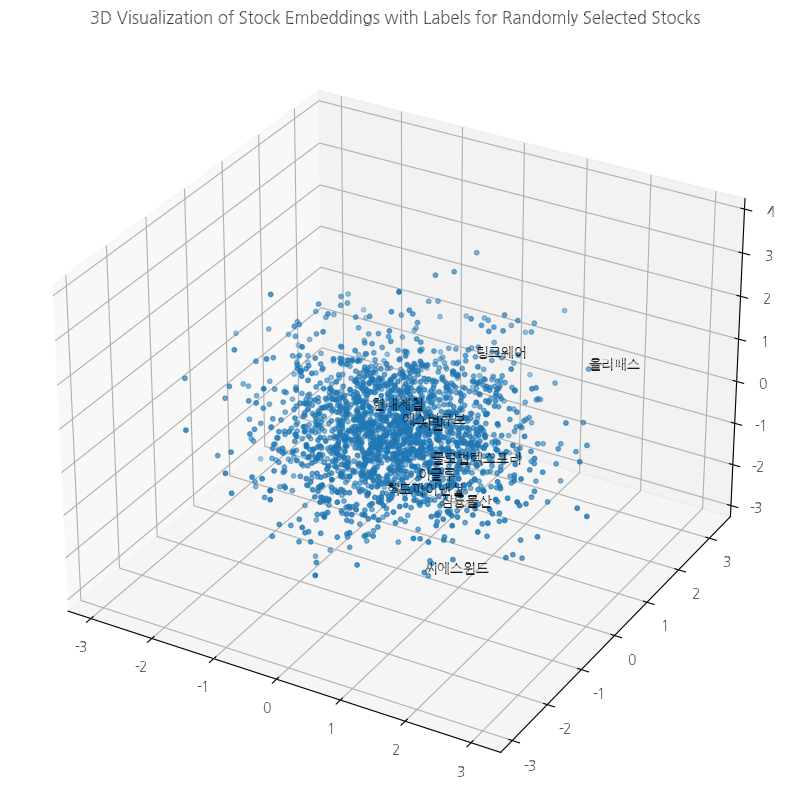

In [ ]:
# 1. Required imports
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import os

# 경고 메시지 처리
import warnings

# unicode minus를 사용하지 않기 위한 설정 (minus 깨짐현상 방지)
plt.rcParams['axes.unicode_minus'] = False
path = '/usr/share/fonts/truetype/nanum/NanumGothicEco.ttf'  # 설치된 나눔글꼴중 원하는 녀석의 전체 경로를 가져오자
font_name = fm.FontProperties(fname=path, size=10).get_name()
print(font_name)
plt.rc('font', family=font_name)

fe = fm.FontEntry(
    fname=r'/usr/share/fonts/truetype/nanum/NanumGothicEco.ttf',name='NanumGothicEco')
fm.fontManager.ttflist.insert(0, fe)

plt.rcParams.update({'font.size': 10, 'font.family': 'NanumGothicEco'})
# 경고메시지 출력 생략
warnings.filterwarnings('ignore')

# 런타임을 다시 실행시켜야 한글폰트가 적용됩니다

# 2. Data Loading and Processing
df_train_additional = pd.read_csv('/content/drive/MyDrive/stock_data.csv')
df_train_additional.sort_values(['날짜', '종목명'], inplace=True)
tickers = df_train_additional['종목명'].values.tolist()
ticker_to_int = {ticker: idx for idx, ticker in enumerate(df_train_additional['종목명'].unique())}
int_to_ticker = {idx: ticker for ticker, idx in ticker_to_int.items()}
ticker_ints = [ticker_to_int[ticker] for ticker in tickers]
n_stocks = len(ticker_to_int)

# 3. Functions and Utilities
def get_ticker_int(ticker):
    return ticker_to_int[ticker]

def get_window_fixed_size_optimized(idx, total, window_size=5):
    start = idx - window_size if (idx - window_size) > 0 else 0
    stop = idx + window_size if (idx + window_size) < total else total
    stock_int = get_ticker_int(tickers[idx])
    window = [get_ticker_int(tickers[i]) for i in range(start, stop) if i != idx]
    needed_samples = 2 * window_size - len(window)
    random_samples = np.random.choice(list(set(ticker_ints) - set(window) - {stock_int}), needed_samples, replace=False)
    window.extend(random_samples)
    return window

# 4. Dataset and DataLoader
class StockDatasetFlattenOptimized(Dataset):
    def __init__(self, tickers, window_size=5):
        self.tickers = tickers
        self.window_size = window_size
        self.data = self.flatten_data()

    def flatten_data(self):
        data = []
        for idx in range(len(self.tickers)):
            center_ticker = self.tickers[idx]
            context_tickers = get_window_fixed_size_optimized(idx, len(self.tickers), self.window_size)
            for context_ticker in context_tickers:
                data.append((center_ticker, context_ticker))
        return data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return torch.tensor(self.data[idx][0]), torch.tensor(self.data[idx][1])

dataset_limited = StockDatasetFlattenOptimized(ticker_ints[:10000])
dataloader_limited = DataLoader(dataset_limited, batch_size=512, shuffle=True)

# 5. Model Definition
class Stock2Vec(nn.Module):
    def __init__(self, n_stocks, n_embedding):
        super(Stock2Vec, self).__init__()
        self.embeddings = nn.Embedding(n_stocks, n_embedding)

    def forward(self, inputs):
        return self.embeddings(inputs)

model = Stock2Vec(n_stocks, n_embedding=50)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# 6. Training
n_epochs = 5
for epoch in range(n_epochs):
    total_loss = 0
    for inputs, targets in dataloader_limited:
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        embeds = model(inputs)
        scores = torch.mm(embeds, model.embeddings.weight.t())
        loss = criterion(scores, targets)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}/{n_epochs}, Loss: {total_loss:.4f}")

print("Summary: Training completed!")

# 7. Visualization with labels for randomly selected stocks
with torch.no_grad():
    all_tickers_tensor = torch.tensor(list(range(n_stocks)))
    embeddings = model(all_tickers_tensor).numpy()

pca = PCA(n_components=3)
embeddings_pca = pca.fit_transform(embeddings)

# selected_tickers = list(ticker_to_int.keys())
selected_tickers = np.random.choice(list(ticker_to_int.keys()), size=10, replace=False)
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(embeddings_pca[:, 0], embeddings_pca[:, 1], embeddings_pca[:, 2], s=10)

# Adding labels for selected tickers
for ticker in selected_tickers:
    idx = ticker_to_int[ticker]
    ax.text(embeddings_pca[idx, 0], embeddings_pca[idx, 1], embeddings_pca[idx, 2], ticker, size=10, color='k')

ax.set_title("3D Visualization of Stock Embeddings with Labels for Randomly Selected Stocks")

plt.show()